# Decision Tree - Human Activity Recognition

### #1: Develop a decision tree using the sci-kit learn module within a single notebook.

In [1]:
#Import Libraries
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report 
from sklearn.metrics import confusion_matrix
import utils9

In [2]:
#Reading TRAINING CSV file of Human Activity Recognition
df_train = pd.read_csv('train.csv')
df_train

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,1,STANDING
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,1,STANDING
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,1,STANDING
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,1,STANDING
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,1,STANDING
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.299665,-0.057193,-0.181233,-0.195387,0.039905,0.077078,-0.282301,0.043616,0.060410,0.210795,...,-0.880324,-0.190437,0.829718,0.206972,-0.425619,-0.791883,0.238604,0.049819,30,WALKING_UPSTAIRS
7348,0.273853,-0.007749,-0.147468,-0.235309,0.004816,0.059280,-0.322552,-0.029456,0.080585,0.117440,...,-0.680744,0.064907,0.875679,-0.879033,0.400219,-0.771840,0.252676,0.050053,30,WALKING_UPSTAIRS
7349,0.273387,-0.017011,-0.045022,-0.218218,-0.103822,0.274533,-0.304515,-0.098913,0.332584,0.043999,...,-0.304029,0.052806,-0.266724,0.864404,0.701169,-0.779133,0.249145,0.040811,30,WALKING_UPSTAIRS
7350,0.289654,-0.018843,-0.158281,-0.219139,-0.111412,0.268893,-0.310487,-0.068200,0.319473,0.101702,...,-0.344314,-0.101360,0.700740,0.936674,-0.589479,-0.785181,0.246432,0.025339,30,WALKING_UPSTAIRS


In [3]:
#Drop the subject column for training data
df_train.drop(columns= "subject", inplace = True)
df_train

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",Activity
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,STANDING
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,STANDING
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,STANDING
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,STANDING
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,STANDING
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.299665,-0.057193,-0.181233,-0.195387,0.039905,0.077078,-0.282301,0.043616,0.060410,0.210795,...,-0.588433,-0.880324,-0.190437,0.829718,0.206972,-0.425619,-0.791883,0.238604,0.049819,WALKING_UPSTAIRS
7348,0.273853,-0.007749,-0.147468,-0.235309,0.004816,0.059280,-0.322552,-0.029456,0.080585,0.117440,...,-0.390738,-0.680744,0.064907,0.875679,-0.879033,0.400219,-0.771840,0.252676,0.050053,WALKING_UPSTAIRS
7349,0.273387,-0.017011,-0.045022,-0.218218,-0.103822,0.274533,-0.304515,-0.098913,0.332584,0.043999,...,0.025145,-0.304029,0.052806,-0.266724,0.864404,0.701169,-0.779133,0.249145,0.040811,WALKING_UPSTAIRS
7350,0.289654,-0.018843,-0.158281,-0.219139,-0.111412,0.268893,-0.310487,-0.068200,0.319473,0.101702,...,0.063907,-0.344314,-0.101360,0.700740,0.936674,-0.589479,-0.785181,0.246432,0.025339,WALKING_UPSTAIRS


In [4]:
#Checking for missing values
val_missing = df_train.isnull().values.any()
print("Values missing:",val_missing)

#Class Distribution
pd.crosstab(index = df_train["Activity"],columns="count")

Values missing: False


col_0,count
Activity,
LAYING,1407
SITTING,1286
STANDING,1374
WALKING,1226
WALKING_DOWNSTAIRS,986
WALKING_UPSTAIRS,1073


In [5]:
#Reading TESTING CSV file of Human Activity Recognition
df_test = pd.read_csv('test.csv')
df_test

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
0,0.257178,-0.023285,-0.014654,-0.938404,-0.920091,-0.667683,-0.952501,-0.925249,-0.674302,-0.894088,...,-0.705974,0.006462,0.162920,-0.825886,0.271151,-0.720009,0.276801,-0.057978,2,STANDING
1,0.286027,-0.013163,-0.119083,-0.975415,-0.967458,-0.944958,-0.986799,-0.968401,-0.945823,-0.894088,...,-0.594944,-0.083495,0.017500,-0.434375,0.920593,-0.698091,0.281343,-0.083898,2,STANDING
2,0.275485,-0.026050,-0.118152,-0.993819,-0.969926,-0.962748,-0.994403,-0.970735,-0.963483,-0.939260,...,-0.640736,-0.034956,0.202302,0.064103,0.145068,-0.702771,0.280083,-0.079346,2,STANDING
3,0.270298,-0.032614,-0.117520,-0.994743,-0.973268,-0.967091,-0.995274,-0.974471,-0.968897,-0.938610,...,-0.736124,-0.017067,0.154438,0.340134,0.296407,-0.698954,0.284114,-0.077108,2,STANDING
4,0.274833,-0.027848,-0.129527,-0.993852,-0.967445,-0.978295,-0.994111,-0.965953,-0.977346,-0.938610,...,-0.846595,-0.002223,-0.040046,0.736715,-0.118545,-0.692245,0.290722,-0.073857,2,STANDING
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2942,0.310155,-0.053391,-0.099109,-0.287866,-0.140589,-0.215088,-0.356083,-0.148775,-0.232057,0.185361,...,-0.750809,-0.337422,0.346295,0.884904,-0.698885,-0.651732,0.274627,0.184784,24,WALKING_UPSTAIRS
2943,0.363385,-0.039214,-0.105915,-0.305388,0.028148,-0.196373,-0.373540,-0.030036,-0.270237,0.185361,...,-0.700274,-0.736701,-0.372889,-0.657421,0.322549,-0.655181,0.273578,0.182412,24,WALKING_UPSTAIRS
2944,0.349966,0.030077,-0.115788,-0.329638,-0.042143,-0.250181,-0.388017,-0.133257,-0.347029,0.007471,...,-0.467179,-0.181560,0.088574,0.696663,0.363139,-0.655357,0.274479,0.181184,24,WALKING_UPSTAIRS
2945,0.237594,0.018467,-0.096499,-0.323114,-0.229775,-0.207574,-0.392380,-0.279610,-0.289477,0.007471,...,-0.617737,0.444558,-0.819188,0.929294,-0.008398,-0.659719,0.264782,0.187563,24,WALKING_UPSTAIRS


In [6]:
#Drop the subject column for testing data
df_test.drop(columns= "subject", inplace = True)
df_test

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",Activity
0,0.257178,-0.023285,-0.014654,-0.938404,-0.920091,-0.667683,-0.952501,-0.925249,-0.674302,-0.894088,...,-0.330370,-0.705974,0.006462,0.162920,-0.825886,0.271151,-0.720009,0.276801,-0.057978,STANDING
1,0.286027,-0.013163,-0.119083,-0.975415,-0.967458,-0.944958,-0.986799,-0.968401,-0.945823,-0.894088,...,-0.121845,-0.594944,-0.083495,0.017500,-0.434375,0.920593,-0.698091,0.281343,-0.083898,STANDING
2,0.275485,-0.026050,-0.118152,-0.993819,-0.969926,-0.962748,-0.994403,-0.970735,-0.963483,-0.939260,...,-0.190422,-0.640736,-0.034956,0.202302,0.064103,0.145068,-0.702771,0.280083,-0.079346,STANDING
3,0.270298,-0.032614,-0.117520,-0.994743,-0.973268,-0.967091,-0.995274,-0.974471,-0.968897,-0.938610,...,-0.344418,-0.736124,-0.017067,0.154438,0.340134,0.296407,-0.698954,0.284114,-0.077108,STANDING
4,0.274833,-0.027848,-0.129527,-0.993852,-0.967445,-0.978295,-0.994111,-0.965953,-0.977346,-0.938610,...,-0.534685,-0.846595,-0.002223,-0.040046,0.736715,-0.118545,-0.692245,0.290722,-0.073857,STANDING
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2942,0.310155,-0.053391,-0.099109,-0.287866,-0.140589,-0.215088,-0.356083,-0.148775,-0.232057,0.185361,...,-0.376278,-0.750809,-0.337422,0.346295,0.884904,-0.698885,-0.651732,0.274627,0.184784,WALKING_UPSTAIRS
2943,0.363385,-0.039214,-0.105915,-0.305388,0.028148,-0.196373,-0.373540,-0.030036,-0.270237,0.185361,...,-0.320418,-0.700274,-0.736701,-0.372889,-0.657421,0.322549,-0.655181,0.273578,0.182412,WALKING_UPSTAIRS
2944,0.349966,0.030077,-0.115788,-0.329638,-0.042143,-0.250181,-0.388017,-0.133257,-0.347029,0.007471,...,-0.118854,-0.467179,-0.181560,0.088574,0.696663,0.363139,-0.655357,0.274479,0.181184,WALKING_UPSTAIRS
2945,0.237594,0.018467,-0.096499,-0.323114,-0.229775,-0.207574,-0.392380,-0.279610,-0.289477,0.007471,...,-0.205445,-0.617737,0.444558,-0.819188,0.929294,-0.008398,-0.659719,0.264782,0.187563,WALKING_UPSTAIRS


In [7]:
#Checking for missing values
isMissing = df_train.isnull().values.any()
print("Values missing:",isMissing)

#Class Distribution (labels)
pd.crosstab(index = df_train["Activity"],columns="count")

Values missing: False


col_0,count
Activity,
LAYING,1407
SITTING,1286
STANDING,1374
WALKING,1226
WALKING_DOWNSTAIRS,986
WALKING_UPSTAIRS,1073


In [8]:
#Features and labels
print('Training data:',df_train.shape)
print('Testing data:',df_test.shape)

Training data: (7352, 562)
Testing data: (2947, 562)


**Observations:**  
* Train data set has 562 Columns/features (including the target/class), and 7352 rows or data points. 
* Test data set has 562 Columns/features (including the target/class), and 2947 rows or data points. 
* The target is in the 'Activity' column and it has 6 unique values.
* I have removed the "subject" column since this one isn't a feature. This one serves more like an identifier.

In [9]:
#Assign features and labels
features_train =  df_train.drop(['Activity'], axis=1)
labels_train = df_train['Activity']
features_test =  df_test.drop(['Activity'], axis=1)
labels_test = df_test['Activity']

In [10]:
#Split df_train into training and validation sets
#71% corresponds to training data
#29% corresponds to testing data
#Ratio chosen 51-20-29
x_train, x_valid, y_train, y_valid = train_test_split(features_train, labels_train, test_size=0.2, random_state = 1)

#df_test for testing data
x_test = features_test
y_test = labels_test

print('x_train shape:',x_train.shape)
print('y_train shape:',y_train.shape)
print('x_valid shape:',x_valid.shape)
print('y_valid shape:',y_valid.shape)
print('x_test shape:', x_test.shape)
print('y_test shape:',y_test.shape)

x_train shape: (5881, 561)
y_train shape: (5881,)
x_valid shape: (1471, 561)
y_valid shape: (1471,)
x_test shape: (2947, 561)
y_test shape: (2947,)


### #2: Try both Gini impurity index and Entropy to create branches.

In [11]:
#Using Gini Impurity Index to create branches
dt_gini = DecisionTreeClassifier(criterion = 'gini', random_state = 1)
dt_gini.fit(x_train, y_train)

DecisionTreeClassifier(random_state=1)

[Text(181.56753239911495, 212.26285714285714, 'X[52] <= 0.096\ngini = 0.831\nsamples = 5881\nvalue = [1134, 1032, 1092, 979, 801, 843]'),
 Text(179.30989885154358, 201.90857142857143, 'gini = 0.0\nsamples = 1134\nvalue = [1134, 0, 0, 0, 0, 0]'),
 Text(183.82516594668635, 201.90857142857143, 'X[389] <= -0.976\ngini = 0.797\nsamples = 4747\nvalue = [0, 1032, 1092, 979, 801, 843]'),
 Text(89.8203034453693, 191.5542857142857, 'X[559] <= 0.14\ngini = 0.5\nsamples = 2124\nvalue = [0, 1032, 1092, 0, 0, 0]'),
 Text(35.61064166052049, 181.2, 'X[57] <= -1.0\ngini = 0.226\nsamples = 1083\nvalue = [0, 942, 141, 0, 0, 0]'),
 Text(10.159350964071226, 170.84571428571428, 'X[179] <= -0.995\ngini = 0.435\nsamples = 72\nvalue = [0, 23, 49, 0, 0, 0]'),
 Text(4.515267095142767, 160.49142857142857, 'X[19] <= -0.998\ngini = 0.386\nsamples = 23\nvalue = [0, 17, 6, 0, 0, 0]'),
 Text(2.2576335475713836, 150.13714285714286, 'gini = 0.0\nsamples = 6\nvalue = [0, 0, 6, 0, 0, 0]'),
 Text(6.77290064271415, 150.1371

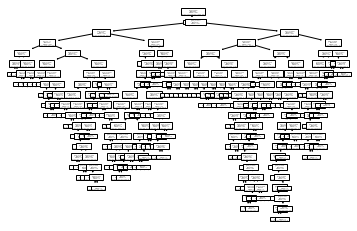

In [12]:
tree.plot_tree(dt_gini)

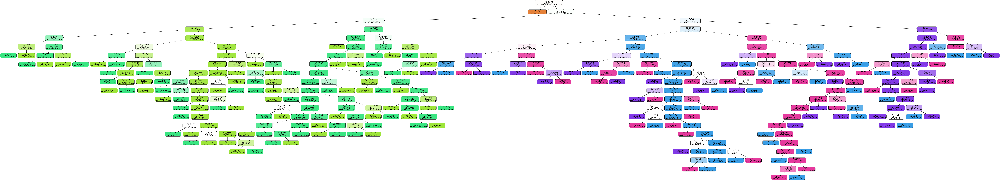

In [13]:
utils9.display_tree(dt_gini)

In [14]:
""""
#Using Entropy to create branches
dt_ent = DecisionTreeClassifier(criterion = 'entropy', random_state = 1)
dt_ent.fit(x_train, y_train)
""""

DecisionTreeClassifier(criterion='entropy', random_state=1)

[Text(147.8176875, 210.192, 'X[389] <= -0.969\nentropy = 2.574\nsamples = 5881\nvalue = [1134, 1032, 1092, 979, 801, 843]'),
 Text(57.0555, 195.696, 'X[52] <= 0.096\nentropy = 1.587\nsamples = 3258\nvalue = [1133, 1032, 1092, 0, 0, 1]'),
 Text(54.8235, 181.2, 'entropy = 0.0\nsamples = 1133\nvalue = [1133, 0, 0, 0, 0, 0]'),
 Text(59.28750000000001, 181.2, 'X[559] <= 0.14\nentropy = 1.005\nsamples = 2125\nvalue = [0, 1032, 1092, 0, 0, 1]'),
 Text(15.903000000000002, 166.704, 'X[49] <= 0.871\nentropy = 0.558\nsamples = 1083\nvalue = [0, 942, 141, 0, 0, 0]'),
 Text(4.464, 152.208, 'X[439] <= -0.959\nentropy = 0.019\nsamples = 558\nvalue = [0, 557, 1, 0, 0, 0]'),
 Text(2.232, 137.712, 'entropy = 0.0\nsamples = 557\nvalue = [0, 557, 0, 0, 0, 0]'),
 Text(6.696000000000001, 137.712, 'entropy = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(27.342000000000002, 152.208, 'X[57] <= -1.0\nentropy = 0.837\nsamples = 525\nvalue = [0, 385, 140, 0, 0, 0]'),
 Text(11.16, 137.712, 'X[51] <= 0.06\n

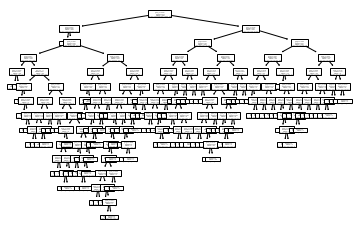

In [15]:
#tree.plot_tree(dt_ent)

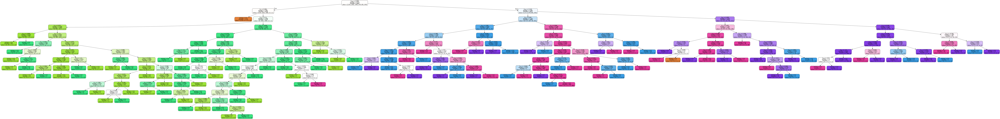

In [16]:
#utils9.display_tree(dt_ent)

In [17]:
""""
#Model Accuracies
print('Gini Impurity Index Accuracies:')
print('Training Accuracy: ', dt_gini.score(x_train, y_train))
print('Validation Accuracy: ', dt_gini.score(x_valid, y_valid))
print('Testing Accuracy: ', dt_gini.score(x_test, y_test))
print('\nEntropy Accuracies:')
print('Training Accuracy: ', dt_ent.score(x_train, y_train))
print('Validation Accuracy: ', dt_ent.score(x_valid, y_valid))
print('Testing Accuracy: ', dt_ent.score(x_test, y_test))
""""

Gini Impurity Index Accuracies:
Training Accuracy:  1.0
Validation Accuracy:  0.9503738953093134
Testing Accuracy:  0.8540889039701391

Entropy Accuracies:
Training Accuracy:  1.0
Validation Accuracy:  0.9490142760027193
Testing Accuracy:  0.845945028842891


**Observations:**  
Based on the accuracies, Gini Index is slightly better than Entropy. Therefore, I'll use this to for further calculations.

### #3: Explain what the following hyperparameters control:

* **max_depth:**  Maximum distance between the root and any leaf.
* **max_features:**  Maximum numbers of features considered at each split
* **min_impurity_decrease:**  A node will be split if this split induces a decrease of the impurity greater than or equal to this value. 
* **min_samples_leaf:**  Minimum number of samples required for a leaf node
* **min_samples_split:** Minimum number of samples required to split a node

### #4: Try at least 5 different choices for the set of hyperparameters. Use the score method to display the accuracy of the training and validation sets for each option.

In [18]:
""""
dt_1 = DecisionTreeClassifier(criterion = 'gini', max_depth = None, min_impurity_decrease = 0.0, max_features = 281, min_samples_leaf = 1, min_samples_split = 2, random_state = 1)
dt_1.fit(x_train, y_train)
print('Training Accuracy: ', dt_1.score(x_train, y_train))
print('Validation Accuracy: ', dt_1.score(x_valid, y_valid))
print('Testing Accuracy: ', dt_1.score(x_test, y_test))
""""

Training Accuracy:  1.0
Validation Accuracy:  0.9428959891230455
Testing Accuracy:  0.8435697319307771


In [19]:
""""
dt_2 = DecisionTreeClassifier(criterion = 'gini', max_depth = 5, min_impurity_decrease = 0.1, max_features = 169, min_samples_leaf = 1, min_samples_split = 3, random_state = 1)
dt_2.fit(x_train, y_train)
print('Training Accuracy: ', dt_2.score(x_train, y_train))
print('Validation Accuracy: ', dt_2.score(x_valid, y_valid))
print('Testing Accuracy: ', dt_2.score(x_test, y_test))
""""

Training Accuracy:  0.5446352661112056
Validation Accuracy:  0.5452073419442556
Testing Accuracy:  0.5307091957923312


In [20]:
""""
dt_3 = DecisionTreeClassifier(criterion = 'gini', max_depth = 10, min_impurity_decrease = 0.01, max_features = 337, min_samples_leaf = 5, min_samples_split = 5, random_state = 1)
dt_3.fit(x_train, y_train)
print('Training Accuracy: ', dt_3.score(x_train, y_train))
print('Validation Accuracy: ', dt_3.score(x_valid, y_valid))
print('Testing Accuracy: ', dt_3.score(x_test, y_test))
""""

Training Accuracy:  0.9074987247066826
Validation Accuracy:  0.9007477906186268
Testing Accuracy:  0.828978622327791


In [21]:
""""
dt_4 = DecisionTreeClassifier(criterion = 'gini', max_depth = None, min_impurity_decrease = 0.001, max_features = None, min_samples_leaf = 1, min_samples_split = 2, random_state = 1)
dt_4.fit(x_train, y_train)
print('Training Accuracy: ', dt_4.score(x_train, y_train))
print('Validation Accuracy: ', dt_4.score(x_valid, y_valid))
print('Testing Accuracy: ', dt_4.score(x_test, y_test))
""""

Training Accuracy:  0.967862608399932
Validation Accuracy:  0.9401767505098573
Testing Accuracy:  0.8608754665761792


In [22]:
dt_5 = DecisionTreeClassifier(criterion = 'gini', max_depth = None, min_impurity_decrease = 0.0, max_features = 400, min_samples_leaf = 1, min_samples_split = 2, random_state = 1)
dt_5.fit(x_train, y_train)
print('Training Accuracy: ', dt_5.score(x_train, y_train))
print('Validation Accuracy: ', dt_5.score(x_valid, y_valid))
print('Testing Accuracy: ', dt_5.score(x_test, y_test))

Training Accuracy:  1.0
Validation Accuracy:  0.9510537049626104
Testing Accuracy:  0.8517136070580251


**Comparing the models:**

|Model|Criterion|max_depth|max_features|min_impurity_decrease|min_samples_leaf|min_samples_split|Training Accuracy|Validation Accuracy|Testing Accuracy|
|-----|---------|---------|------------|---------------------|----------------|-----------------|-----------------|-------------------|----------------|
|dt_1 |  Gini   |   None  |281         |0.0                  |1               |2                |1.0              |0.94               |0.84|
|dt_2 |  Gini   |   5     |169         |0.1                  |1               |3                |0.54              |0.55               |0.53|
|dt_3 |  Gini   |   10    |337         |0.01                 |5               |5                |0.91              |0.90               |0.83|
|dt_4 |  Gini   |   None  |None        |0.001                |1               |2                |0.98              |0.94               |0.86|
|dt_5 |  Gini   |   None  |400         |0.0                  |1               |2                |1.0              |0.95               |0.86|

### #5: Justify your final choice of hyper parameters based on training and validation accuracies. Comment on overfitting, underfitting and depth.

The model the has the best performance is **dt_5**.  
Based on the validation accuracy, this one yields better results. Additionally, it shows 100% accuracy in the training data. 

However, the data might be slightly overfitting since testing data appears to be slightly high compared to the training data. 

### #6: Use the display_tree method in utils.py to display the decision tree.

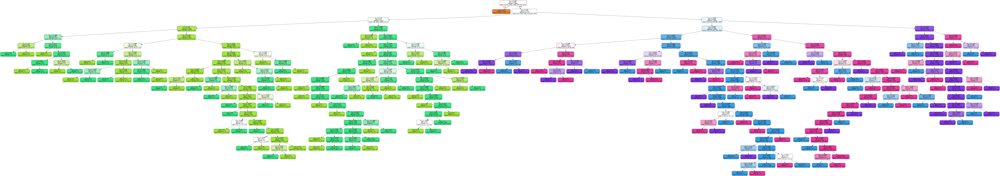

In [23]:
utils9.display_tree(dt_5)

### #7: Use the trained decision tree algorithm to predict the classes within the test data. Use the score method to display the mean accuracy of these predictions.

In [24]:
#Prediction of the first 100 Activities with best model
dt_5.predict(x_test[0:100])

array(['STANDING', 'STANDING', 'STANDING', 'STANDING', 'STANDING',
       'STANDING', 'STANDING', 'STANDING', 'STANDING', 'STANDING',
       'STANDING', 'STANDING', 'STANDING', 'STANDING', 'STANDING',
       'STANDING', 'STANDING', 'STANDING', 'STANDING', 'STANDING',
       'STANDING', 'STANDING', 'STANDING', 'STANDING', 'STANDING',
       'STANDING', 'STANDING', 'STANDING', 'STANDING', 'STANDING',
       'STANDING', 'SITTING', 'STANDING', 'STANDING', 'SITTING',
       'SITTING', 'SITTING', 'SITTING', 'STANDING', 'SITTING', 'SITTING',
       'STANDING', 'STANDING', 'STANDING', 'SITTING', 'SITTING',
       'STANDING', 'STANDING', 'SITTING', 'SITTING', 'STANDING',
       'STANDING', 'SITTING', 'STANDING', 'SITTING', 'LAYING', 'LAYING',
       'LAYING', 'LAYING', 'LAYING', 'LAYING', 'LAYING', 'LAYING',
       'LAYING', 'LAYING', 'LAYING', 'LAYING', 'LAYING', 'LAYING',
       'LAYING', 'LAYING', 'LAYING', 'LAYING', 'LAYING', 'LAYING',
       'LAYING', 'LAYING', 'LAYING', 'LAYING', 'WALKING

In [25]:
#Accuracy of predictions
print('Testing Accuracy: ', dt_5.score(x_test, y_test))

Testing Accuracy:  0.8517136070580251


### Quantitative Analysis of the Decision Tree Algorithm

* Select the best set of options.
* Give ananalysis using markdown text at the bottom of the notebook for your final SVM model:
    * State the accuracy for the training, validation and testing sets.
    * State the confusion matrix for the testing set
    * Indicate which elements of the confusion matrix are the worst errors for your use case, or if false positives/negatives are more or less the same.  

In [26]:
#Best Model 
dt_5 = DecisionTreeClassifier(criterion = 'gini', max_depth = None, min_impurity_decrease = 0.0, max_features = 400, min_samples_leaf = 1, min_samples_split = 2, random_state = 1)
dt_5.fit(x_train, y_train)
print('Best Model: dt_5')
print('Training Accuracy: ', dt_5.score(x_train, y_train))
print('Validation Accuracy: ', dt_5.score(x_valid, y_valid))
print('Testing Accuracy: ', dt_5.score(x_test, y_test))

Best Model: dt_5
Training Accuracy:  1.0
Validation Accuracy:  0.9510537049626104
Testing Accuracy:  0.8517136070580251


In [28]:
print(classification_report(y_test,dt_5.predict(x_test)))

                    precision    recall  f1-score   support

            LAYING       1.00      1.00      1.00       537
           SITTING       0.85      0.78      0.82       491
          STANDING       0.81      0.88      0.84       532
           WALKING       0.80      0.89      0.84       496
WALKING_DOWNSTAIRS       0.86      0.80      0.83       420
  WALKING_UPSTAIRS       0.77      0.73      0.75       471

          accuracy                           0.85      2947
         macro avg       0.85      0.85      0.85      2947
      weighted avg       0.85      0.85      0.85      2947



In [27]:
confusion_matrix(y_test, dt_5.predict(x_test))

array([[537,   0,   0,   0,   0,   0],
       [  0, 385, 106,   0,   0,   0],
       [  0,  66, 466,   0,   0,   0],
       [  0,   0,   0, 439,  13,  44],
       [  0,   0,   0,  24, 337,  59],
       [  0,   0,   0,  85,  40, 346]])